In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import scipy.sparse as sp
import time
import gget
from scipy.stats import spearmanr
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
from tqdm import tqdm
import textwrap

import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.patches import Patch

import anndata as an
import scanpy as sc
import rapids_singlecell as rsc
import scvi

from scvi.external import CellAssign

import cupy as cp
import cuml

sc.settings.verbosity = 3

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


# Load anndata

In [2]:
%%time
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/pseudotime.h5ad"
adata = sc.read_h5ad(fpath)
adata

CPU times: user 363 ms, sys: 2.64 s, total: 3 s
Wall time: 17.1 s


AnnData object with n_obs × n_vars = 15867 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersio

# Load Capybara scores

In [3]:
%%time
# Load Capybara output
# fpath_scale = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/capybara_basename_scale.csv"
# fpath_scale = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/basename_simple_scale.csv"
# fpath_scale = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/gomes_scale.csv"
fpath_scale = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/celltype_simplified_scale.csv"
df = pd.read_csv(fpath_scale)
print(f"{df.shape=}")
df.head()

df.shape=(15867, 18)
CPU times: user 36.8 ms, sys: 10.3 ms, total: 47.1 ms
Wall time: 59.4 ms


,cell_name,frxn_blood vessel endothelial cell,frxn_embryonic fibroblast,frxn_endothelial cell,frxn_endothelial cell of vascular tree,frxn_erythroid progenitor cell,frxn_fibro/adipogenic progenitor cell,frxn_fibroblast,frxn_hematopoietic multipotent progenitor cell,frxn_hematopoietic precursor cell,frxn_hematopoietic stem cell,frxn_megakaryocyte progenitor cell,frxn_retinal blood vessel endothelial cell,frxn_skeletal muscle fibroblast,frxn_skin fibroblast,frxn_vein endothelial cell,Lagrangian,Error
0,AAACCCAAGGTTACCT-1,2.655916e-02,0.216079,0.091959,6.328028e-19,0.173432,0.212594,-3.560497e-17,4.130600e-18,5.345941e-02,1.141456e-02,-1.043146e-18,1.772187e-02,0.000000e+00,0.108831,-6.786521e-20,0,2313.197846
1,AAACCCAAGTTGAAGT-1,2.168404e-19,0.165552,0.068983,6.479794e-19,0.195067,0.307927,2.772110e-19,1.072217e-17,3.286334e-02,1.172854e-19,1.588551e-19,9.481993e-02,3.919296e-19,0.039850,-4.063729e-18,0,2383.611270
2,AAACCCAAGTTGTCGT-1,4.254147e-02,0.289692,0.004696,-7.821219e-20,0.265483,0.141732,1.078867e-17,4.761845e-17,0.000000e+00,7.760973e-19,-1.391568e-17,-1.204080e-17,7.148037e-19,0.103968,1.489369e-17,0,2356.420129
3,AAACCCACAGAAGCGT-1,0.000000e+00,0.243536,0.019734,3.229160e-19,0.108869,0.193898,2.272758e-18,4.835065e-18,4.834411e-02,-4.798990e-19,1.285999e-17,5.416928e-02,2.509075e-21,0.198415,9.908375e-17,0,2402.670451
4,AAACCCACAGGAGGTT-1,3.103968e-02,0.218691,0.163875,1.206910e-17,0.187455,0.130098,1.171735e-17,-8.434668e-18,-2.110209e-17,1.107051e-18,-2.003732e-17,4.612713e-02,6.938894e-18,0.099957,2.334821e-17,0,2134.605059


In [4]:
# Set index to 'cell_name' for merging
df = df.set_index('cell_name')

# Sanity check: ensure all indices in df exist in adata.obs
common_cells = adata.obs.index.intersection(df.index)
print(f"Merging on {len(common_cells)} shared cells")

# Merge into adata.obs
adata.obs = adata.obs.join(df, how='left')  # 'left' keeps all cells in adata.obs

adata.obs.head()

Merging on 15867 shared cells


,batch,phase,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,...,frxn_hematopoietic multipotent progenitor cell,frxn_hematopoietic precursor cell,frxn_hematopoietic stem cell,frxn_megakaryocyte progenitor cell,frxn_retinal blood vessel endothelial cell,frxn_skeletal muscle fibroblast,frxn_skin fibroblast,frxn_vein endothelial cell,Lagrangian,Error
AAACCCAAGGTTACCT-1,hsc,G1,3679,8.210668,11202.0,9.323937,27.932512,37.752187,47.491519,60.382075,...,4.130600e-18,5.345941e-02,1.141456e-02,-1.043146e-18,1.772187e-02,0.000000e+00,0.108831,-6.786521e-20,0,2313.197846
AAACCCAAGTTGAAGT-1,hsc,G1,3987,8.291045,10579.0,9.266721,24.766046,32.867001,40.835618,53.313168,...,1.072217e-17,3.286334e-02,1.172854e-19,1.588551e-19,9.481993e-02,3.919296e-19,0.039850,-4.063729e-18,0,2383.611270
AAACCCAAGTTGTCGT-1,hsc,S,2585,7.857868,6735.0,8.815222,28.537491,37.371938,48.136600,63.533779,...,4.761845e-17,0.000000e+00,7.760973e-19,-1.391568e-17,-1.204080e-17,7.148037e-19,0.103968,1.489369e-17,0,2356.420129
AAACCCACAGAAGCGT-1,hsc,G1,2358,7.765993,5416.0,8.597297,24.686115,34.785820,45.217873,60.672083,...,4.835065e-18,4.834411e-02,-4.798990e-19,1.285999e-17,5.416928e-02,2.509075e-21,0.198415,9.908375e-17,0,2402.670451
AAACCCACAGGAGGTT-1,hsc,G1,4997,8.516793,21937.0,9.995976,31.845740,40.552491,50.152710,63.440762,...,-8.434668e-18,-2.110209e-17,1.107051e-18,-2.003732e-17,4.612713e-02,6.938894e-18,0.099957,2.334821e-17,0,2134.605059


### frxn_cols = [col for col in df.columns if col.startswith("frxn_")]
frxn_cols

['vein endothelial cell' 'skin fibroblast' 'skeletal muscle fibroblast'
 'retinal blood vessel endothelial cell' 'megakaryocyte progenitor cell'
 'hematopoietic stem cell' 'hematopoietic precursor cell'
 'hematopoietic multipotent progenitor cell' 'fibroblast'
 'fibro/adipogenic progenitor cell' 'erythroid progenitor cell'
 'endothelial cell of vascular tree' 'endothelial cell'
 'embryonic fibroblast' 'blood vessel endothelial cell']


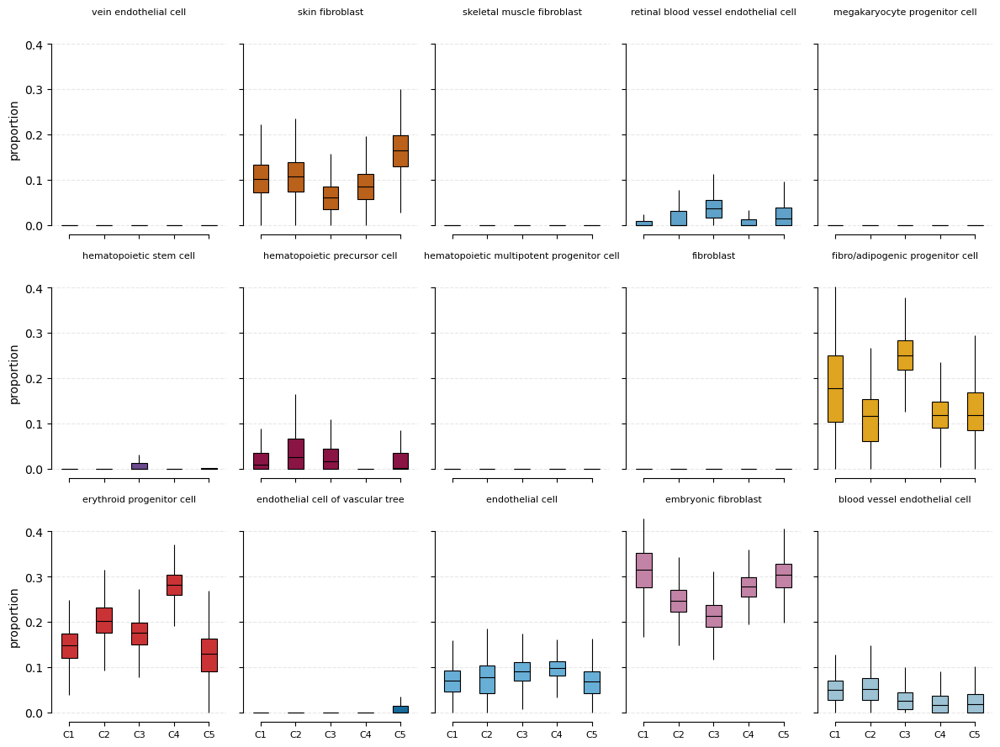

In [6]:
# Copy and melt
df = adata.obs.copy()
frxn_cols = [col for col in df.columns if col.startswith("frxn_")]
df_melted = df.melt(
    id_vars=["cluster_str"],
    value_vars=frxn_cols,
    var_name="Cell Type",
    value_name="Fraction"
)

df_melted['Cell Type'] = df_melted['Cell Type'].str.replace('frxn_', '')
df_melted = df_melted.sort_values('Cell Type', ascending=False)

print(df_melted['Cell Type'].unique())

palette = {
    # Fibroblast lineage – warm earth tones
    'fibroblast': '#E69F00',                        # orange
    'skin fibroblast': '#D55E00',                   # rust
    'skeletal muscle fibroblast': '#F0E442',        # yellow
    'embryonic fibroblast': '#CC79A7',              # soft pink
    'fibro/adipogenic progenitor cell': '#FFB000',  # gold

    # Endothelial lineage – cool blues
    'endothelial cell': '#56B4E9',                          # sky blue
    'endothelial cell of vascular tree': '#0072B2',         # strong blue
    'blood vessel endothelial cell': '#92C5DE',             # light blue
    'retinal blood vessel endothelial cell': '#4EA5D9',      # mid blue
    'vein endothelial cell': '#08306B',                     # dark navy

    # Hematopoietic lineage – purples and reds
    'hematopoietic stem cell': '#6A3D9A',                    # deep violet
    'hematopoietic precursor cell': '#9E0142',               # red-purple
    'hematopoietic multipotent progenitor cell': '#B35806',  # burnt orange
    'megakaryocyte progenitor cell': '#8E063B',              # wine red
    'erythroid progenitor cell': '#E31A1C'                   # red
}

# Plot with FacetGrid
g = sns.FacetGrid(
    df_melted,
    col="Cell Type",
    col_wrap=5,
    sharey=True,
    height=3,
    aspect=0.8,
)

g.map_dataframe(
    sns.boxplot,
    x="cluster_str",
    y="Fraction",
    hue='Cell Type',
    order=sorted(df["cluster_str"].unique()),
    width=0.45,
    linecolor='k',
    palette=palette,
    capprops={'linewidth': 0},  
    showfliers=False,
    linewidth=0.8
)

g.set_axis_labels("", "proportion")
g.set_titles(col_template="{col_name}", size=8)
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=0, labelsize=8)
    ax.grid(axis='y', linestyle='--', alpha=0.3)

g.fig.subplots_adjust(wspace=0.2)

plt.tight_layout()
sns.despine(trim=True)
plt.show()


predcition
embryonic fibroblast                9532
fibro/adipogenic progenitor cell    3047
erythroid progenitor cell           3031
skin fibroblast                      229
hematopoietic precursor cell          27
blood vessel endothelial cell          1


<Axes: xlabel='FA1', ylabel='FA2'>

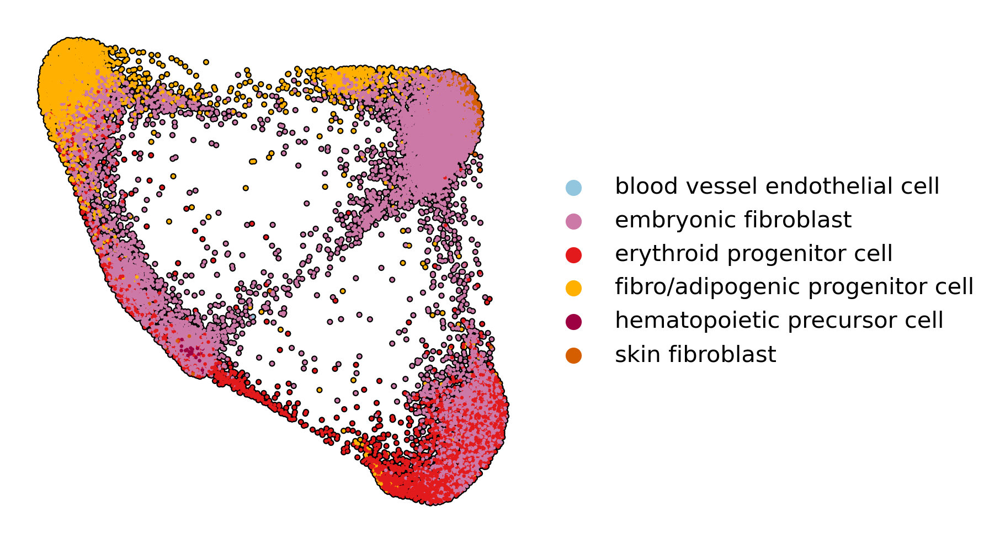

In [7]:
frxn_cols = [col for col in adata.obs.columns if col.startswith("frxn_")]
adata.obs['predcition'] = adata.obs[frxn_cols].idxmax(axis=1)
adata.obs['predcition'] = adata.obs['predcition'].str.replace('frxn_', '')

print(adata.obs['predcition'].value_counts().to_string())


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.draw_graph(
    adata, 
    color=['predcition'],
    size=10,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    na_in_legend=False,
    palette=palette,
    title="",
    frameon=False,
    wspace=0.15,
    show=False, 
)


# Hybrid assignments

In [8]:
# Assign based on max fraction
frac_cols = [x for x in adata.obs.columns if 'frxn_' in x]
print(frac_cols)

# Relaxed threshold for hybrid assignment
hybrid_thresh = 0.2

def assign_relaxed_hybrid(row):
    # Get fractions above threshold
    above_thresh = row[row > hybrid_thresh].index.tolist()
    
    # Clean and format label
    if len(above_thresh) == 0:
        return "unassigned"
    
    clean_labels = [s.replace("frxn_", "").replace("_", " ") for s in above_thresh]
    return "+".join(sorted(clean_labels))

# Apply to obs
adata.obs['capybara_assignment'] = adata.obs[frac_cols].apply(assign_relaxed_hybrid, axis=1)

print(adata.obs['capybara_assignment'].value_counts().to_string())
print()

# Group and count
plot_df = (
    adata.obs
    .groupby(['cluster_str', 'capybara_assignment'])
    .size()
    .reset_index(name='count')
)

# Clean labels
plot_df['capybara_assignment'] = (
    plot_df['capybara_assignment']
    .str.replace("frxn_", "", regex=False)
    .str.replace("_", " ")
)

# Normalize to proportions within each cluster
plot_df['proportion'] = (
    plot_df
    .groupby('cluster_str')['count']
    .transform(lambda x: x / x.sum())
)
plot_df.head()

['frxn_blood vessel endothelial cell', 'frxn_embryonic fibroblast', 'frxn_endothelial cell', 'frxn_endothelial cell of vascular tree', 'frxn_erythroid progenitor cell', 'frxn_fibro/adipogenic progenitor cell', 'frxn_fibroblast', 'frxn_hematopoietic multipotent progenitor cell', 'frxn_hematopoietic precursor cell', 'frxn_hematopoietic stem cell', 'frxn_megakaryocyte progenitor cell', 'frxn_retinal blood vessel endothelial cell', 'frxn_skeletal muscle fibroblast', 'frxn_skin fibroblast', 'frxn_vein endothelial cell']
capybara_assignment
embryonic fibroblast+erythroid progenitor cell                                              5495
embryonic fibroblast                                                                        4027
embryonic fibroblast+fibro/adipogenic progenitor cell                                       2673
embryonic fibroblast+skin fibroblast                                                        1107
fibro/adipogenic progenitor cell                                       

/tmp/ipykernel_2491922/1075804446.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(['cluster_str', 'capybara_assignment'])
/tmp/ipykernel_2491922/1075804446.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby('cluster_str')['count']


,cluster_str,capybara_assignment,count,proportion
0,C1,blood vessel endothelial cell+erythroid progen...,0,0.000000
1,C1,embryonic fibroblast,400,0.479616
2,C1,embryonic fibroblast+endothelial cell,0,0.000000
3,C1,embryonic fibroblast+erythroid progenitor cell,52,0.062350
4,C1,embryonic fibroblast+erythroid progenitor cell...,21,0.025180


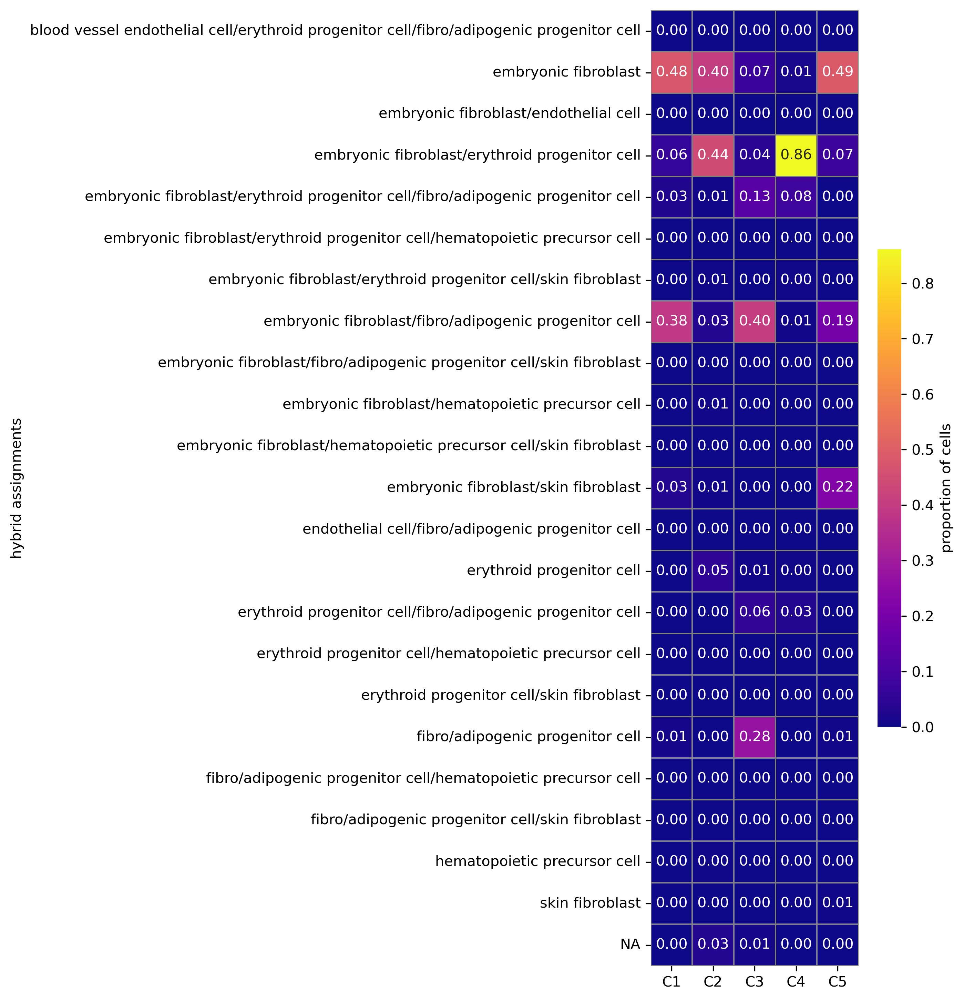

In [9]:
# Pivot to wide format: rows = assignment, columns = cluster, values = proportion
heat_df = plot_df.pivot(
    index='capybara_assignment',
    columns='cluster_str',
    values='proportion'
).fillna(0)


# Define abbreviations
abbrev_map = {
    'fibroblasts': 'Fib',
    'hematopoietic progenitors': 'HP',
    'endothelial cells': 'EC',
    'hsc': 'HSC',
    'unassigned': 'NA'
}

# Helper to rename full label to abbreviations and replace "+" with "/"
def abbreviate(label):
    parts = label.split('+')
    abbrev_parts = [abbrev_map.get(p.strip(), p.strip()) for p in parts]
    return '/'.join(abbrev_parts)

# Apply to index
heat_df.index = heat_df.index.map(abbreviate)


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4.75, 10

sns.heatmap(
    heat_df,
    cmap='plasma',
    linewidths=0.5,
    square=True,
    linecolor='gray',
    cbar_kws={'label': 'proportion of cells', 'shrink': 0.5},
    annot=True,
    fmt=".2f"
)

plt.xlabel("")
plt.ylabel("hybrid assignments")
plt.tight_layout()
plt.show()


# Find the correlates

In [10]:
# Extract gene expression matrix (assumes log-normalized)
X = adata.X
if not isinstance(X, np.ndarray):
    X = X.toarray()  # Convert sparse matrix to dense if needed

# Get gene names
gene_names = adata.var_names

# Extract cell-level fractions
obs_df = adata.obs[frxn_cols].copy()
assert obs_df.shape[0] == X.shape[0], "Mismatch in number of cells"

# Store results
results = []

print("Computing Spearman correlations...")
for frxn_col in tqdm(frxn_cols):
    for i, gene in enumerate(gene_names):
        rho, pval = spearmanr(X[:, i], obs_df[frxn_col])
        results.append({
            'Fraction Type': frxn_col,
            'Gene': gene,
            'SpearmanR': rho,
            'P-value': pval
        })

# Convert to DataFrame
cor_df = pd.DataFrame(results)

print('done!')


Computing Spearman correlations...


100%|██████████| 15/15 [12:10<00:00, 48.70s/it]

done!


In [11]:
# For each fraction type, get top genes by absolute Spearman R
alpha = 0.05
pdf = cor_df[cor_df['P-value'] < alpha].copy()
pdf = pdf.sort_values(['Fraction Type', 'SpearmanR'], ascending=[True, False])
pdf = pdf[~pdf['Gene'].str.startswith('RP')]


# For each fraction type, get top genes by absolute Spearman R
top_cor_df = pdf.groupby('Fraction Type', group_keys=False).head(15)
print(top_cor_df.to_string(index=False))

                                 Fraction Type            Gene  SpearmanR       P-value
            frxn_blood vessel endothelial cell            NME2   0.339044  0.000000e+00
            frxn_blood vessel endothelial cell         ATP5F1E   0.337618  0.000000e+00
            frxn_blood vessel endothelial cell       MIR4300HG   0.324318  0.000000e+00
            frxn_blood vessel endothelial cell           ATOX1   0.308414  0.000000e+00
            frxn_blood vessel endothelial cell            ELOB   0.302526  0.000000e+00
            frxn_blood vessel endothelial cell           SERF2   0.298693  0.000000e+00
            frxn_blood vessel endothelial cell            UBL5   0.284004 4.261739e-292
            frxn_blood vessel endothelial cell          NDUFB2   0.281787 2.140031e-287
            frxn_blood vessel endothelial cell             FTL   0.274554 2.322608e-272
            frxn_blood vessel endothelial cell            MT2A   0.273763 9.631407e-271
            frxn_blood vessel en

# Enrichment

In [12]:
# For each fraction type, get top genes by absolute Spearman R
alpha = 0.05
pdf = cor_df[cor_df['P-value'] < alpha].copy()
pdf = pdf.sort_values(['Fraction Type', 'SpearmanR'], ascending=[True, False])
pdf = pdf[~pdf['Gene'].str.startswith('RP')]

# For each fraction type, get top genes by absolute Spearman R
top_cor_df = pdf.groupby('Fraction Type', group_keys=False).head(15)

top_cor_df.head()

,Fraction Type,Gene,SpearmanR,P-value
14007,frxn_blood vessel endothelial cell,NME2,0.339044,0.0
1111,frxn_blood vessel endothelial cell,ATP5F1E,0.337618,0.0
13096,frxn_blood vessel endothelial cell,MIR4300HG,0.324318,0.0
1077,frxn_blood vessel endothelial cell,ATOX1,0.308414,0.0
4179,frxn_blood vessel endothelial cell,ELOB,0.302526,0.0


12:05:43 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_blood vessel endothelial cell ====================
                                                               path_name  adj_p_val                genes
                           aerobic electron transport chain (GO:0019646)   0.001003 NDUFB2,UQCR11,UQCR10
     mitochondrial ATP synthesis coupled electron transport (GO:0042775)   0.001003 NDUFB2,UQCR11,UQCR10
mitochondrial electron transport, ubiquinol to cytochrome c (GO:0006122)   0.001008        UQCR11,UQCR10
                  cellular transition metal ion homeostasis (GO:0046916)   0.001008       MT2A,ATOX1,FTL
                            cellular copper ion homeostasis (GO:0006878)   0.001008           MT2A,ATOX1
                                     copper ion homeostasis (GO:0055070)   0.001253           MT2A,ATOX1
                     intracellular sequestering of iron ion (GO:0006880)   0.049617                  FTL
                        cellular response to erythropoietin (GO:0036018)   0.049617

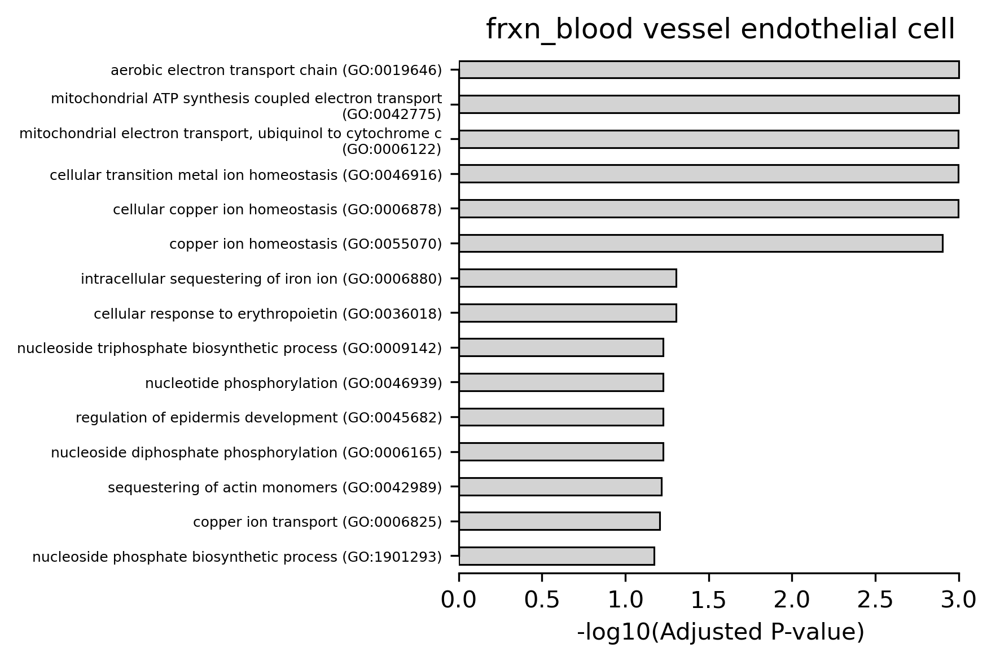

12:05:44 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_embryonic fibroblast ====================
                                                                          path_name  adj_p_val                     genes
                                                    muscle contraction (GO:0006936)   0.000012 MYL6,CALD1,TPM2,TPM1,MYL9
                                         actin-myosin filament sliding (GO:0033275)   0.000384            MYL6,TPM2,TPM1
                                               muscle filament sliding (GO:0030049)   0.000384            MYL6,TPM2,TPM1
negative regulation of pathway-restricted SMAD protein phosphorylation (GO:0060394)   0.001913                GREM1,DKK1
                     regulation of cardiac muscle cell differentiation (GO:2000725)   0.002190                GREM1,DKK1
                                   regulation of muscle system process (GO:0090257)   0.002190                 TPM1,MYL9
                            negative regulation of signal transduction (GO:0009968)  

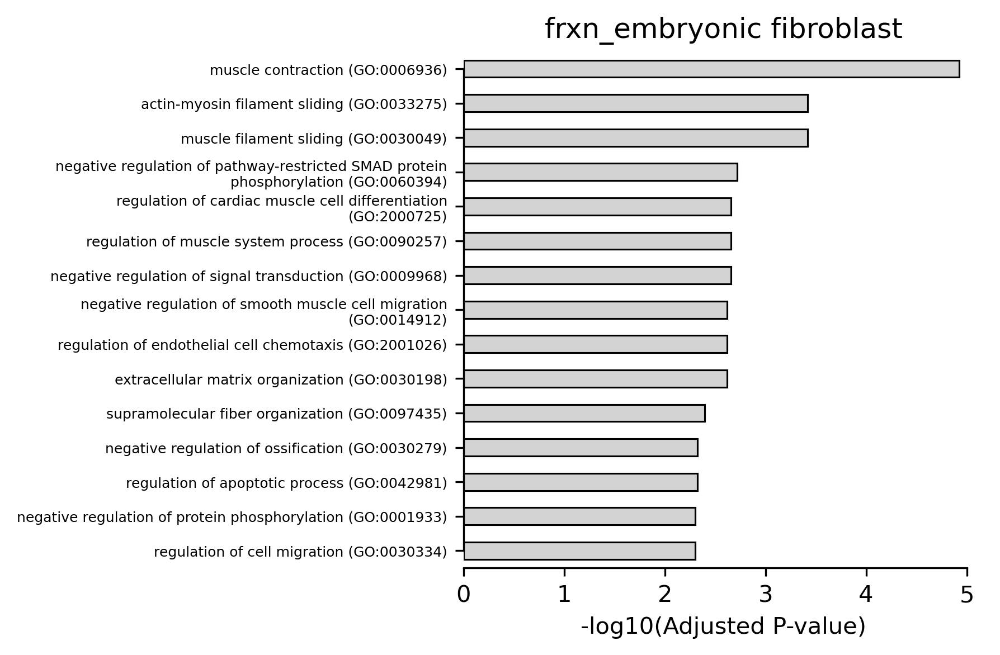

12:05:44 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_endothelial cell ====================
                                                          path_name  adj_p_val              genes
    positive regulation of cellular component movement (GO:0051272)   0.052365       CAVIN1,ACTN4
                          substantia nigra development (GO:0021762)   0.052365         CALM2,ACTB
                  positive regulation of cell motility (GO:2000147)   0.052365 CAVIN1,ITGA6,ACTN4
                           cellular component assembly (GO:0022607)   0.052365     EZR,YWHAZ,ACTB
                 regulation of NIK/NF-kappaB signaling (GO:1901222)   0.052365          ACTN4,EZR
                                cell junction assembly (GO:0034329)   0.052365         ITGA6,ACTB
          cellular response to organonitrogen compound (GO:0071417)   0.052365           EZR,ACTB
regulation of protein serine/threonine kinase activity (GO:0071900)   0.052365         CALM2,ACTB
       regulation of sodium:proton antiporter activity

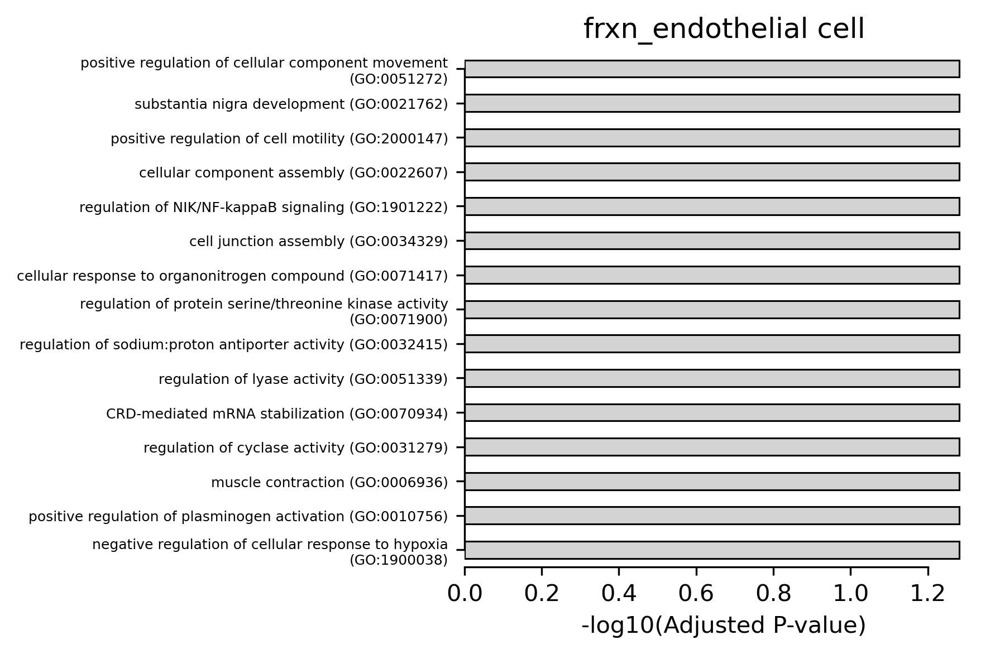

12:05:45 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_endothelial cell of vascular tree ====================
                                                               path_name  adj_p_val                                genes
                               defense response to symbiont (GO:0140546)   0.000435               IFI16,STAT1,IFI6,IFIT1
                                  defense response to virus (GO:0051607)   0.000435               IFI16,STAT1,IFI6,IFIT1
      negative regulation of endothelial cell proliferation (GO:0001937)   0.000435                     STAT1,CCL2,THBS1
                        cytokine-mediated signaling pathway (GO:0019221)   0.000435 STAT1,IFI6,CCL2,TNFRSF11B,IFIT1,GBP1
negative regulation of cysteine-type endopeptidase activity (GO:2000117)   0.000789                     IFI16,IFI6,THBS1
                 cellular response to tumor necrosis factor (GO:0071356)   0.000794            STAT1,CCL2,TNFRSF11B,GBP1
   regulation by virus of viral protein levels in host cell (GO:0046719)

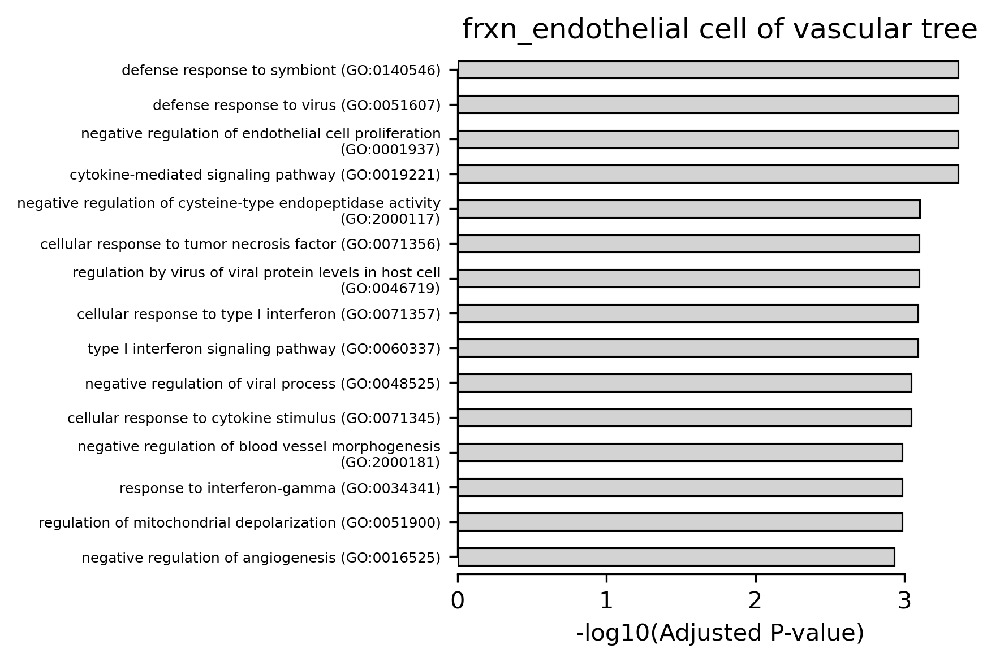

12:05:46 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_erythroid progenitor cell ====================
                                                             path_name  adj_p_val                     genes
                     mitotic sister chromatid segregation (GO:0000070)   0.000111  PRC1,NUSAP1,CEP55,DLGAP5
microtubule cytoskeleton organization involved in mitosis (GO:1902850)   0.000138 CENPF,NUSAP1,BIRC5,DLGAP5
                             mitotic spindle organization (GO:0007052)   0.000207   CENPF,PRC1,BIRC5,DLGAP5
                                     kinetochore assembly (GO:0051382)   0.000627              CENPF,DLGAP5
                                 kinetochore organization (GO:0051383)   0.001084              CENPF,DLGAP5
                                 regulation of cell cycle (GO:0051726)   0.001190  CENPF,PCLAF,BIRC5,DLGAP5
        regulation of mitotic sister chromatid separation (GO:0010965)   0.001190               PTTG1,UBE2C
      regulation of mitotic metaphase/anaphase transition (GO:0

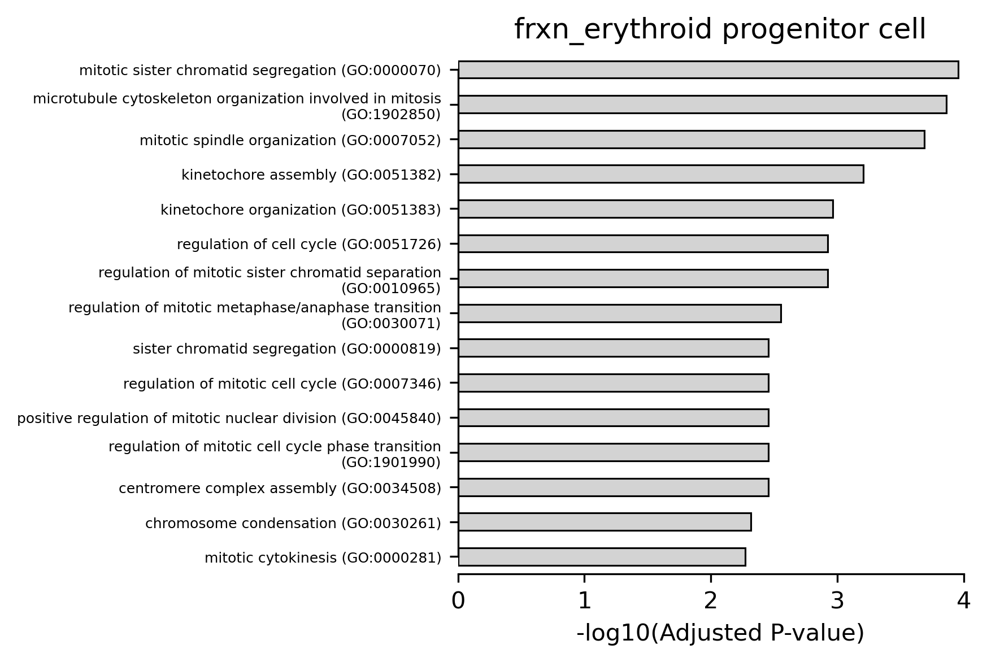

12:05:46 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_fibro/adipogenic progenitor cell ====================
                                                                                           path_name  adj_p_val       genes
                                                   positive regulation of cell adhesion (GO:0045785)   0.063271 MAGI1,PRKCA
                                       positive regulation of epithelial cell migration (GO:0010634)   0.063271 DOCK5,PRKCA
                                       negative regulation of smooth muscle contraction (GO:0045986)   0.063271       DOCK5
                                                      histone-threonine phosphorylation (GO:0035405)   0.063271       PRKCA
regulation of adenylate cyclase-activating G protein-coupled receptor signaling pathway (GO:0106070)   0.063271       PRKCA
                            regulation of vascular associated smooth muscle contraction (GO:0003056)   0.063271       DOCK5
                                                    

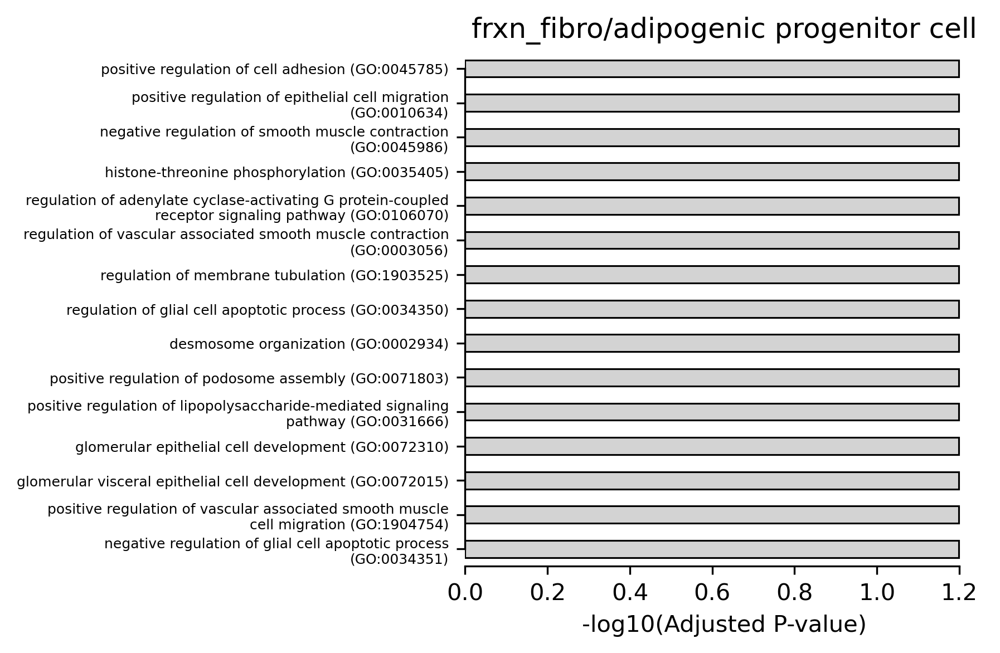

12:05:47 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_fibroblast ====================
                                                               path_name    adj_p_val                            genes
                               defense response to symbiont (GO:0140546) 7.888350e-08 IFI16,STAT1,MX1,IFI6,ISG15,IFIT1
                                  defense response to virus (GO:0051607) 7.888350e-08 IFI16,STAT1,MX1,IFI6,ISG15,IFIT1
                     cellular response to type I interferon (GO:0071357) 9.732242e-08       STAT1,MX1,IFI6,ISG15,IFIT1
                        type I interferon signaling pathway (GO:0060337) 9.732242e-08       STAT1,MX1,IFI6,ISG15,IFIT1
                       negative regulation of viral process (GO:0048525) 1.138462e-07      IFI16,STAT1,MX1,ISG15,IFIT1
                              response to type I interferon (GO:0034340) 2.044031e-06                  MX1,ISG15,IFIT1
            negative regulation of viral genome replication (GO:0045071) 3.882614e-06            IFI16,MX1,IS

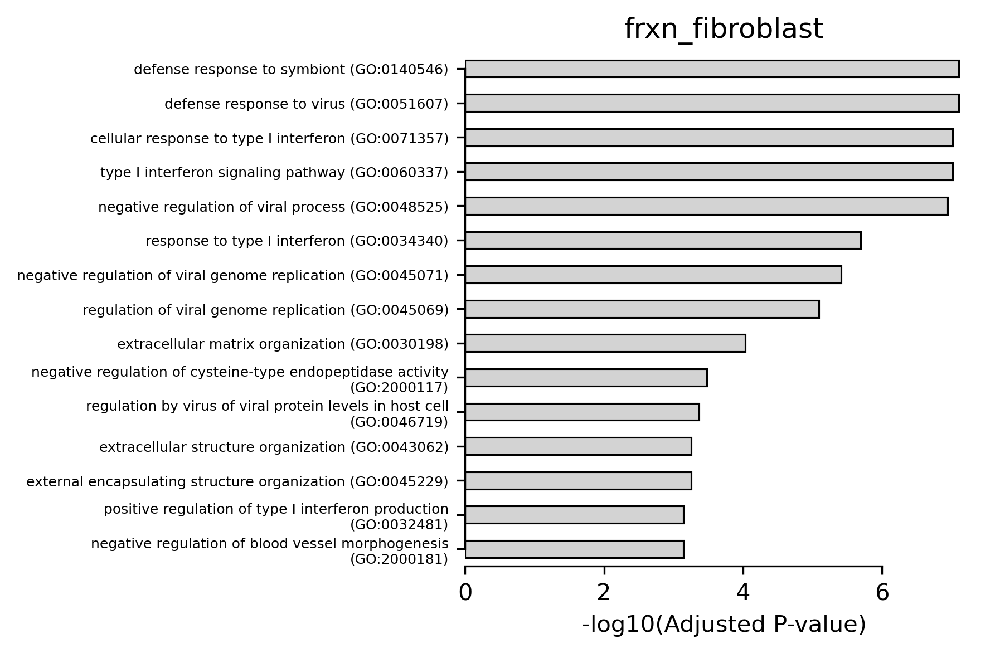

12:05:48 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_hematopoietic multipotent progenitor cell ====================
                                                          path_name  adj_p_val            genes
     regulation of mitotic sister chromatid separation (GO:0010965)   0.008955      PTTG1,UBE2C
                       regulation of exit from mitosis (GO:0007096)   0.027373       ANLN,UBE2C
                                   mitotic cytokinesis (GO:0000281)   0.028837      ANLN,NUSAP1
                              regulation of cell cycle (GO:0051726)   0.030971 PCLAF,CKS2,BIRC5
                    cytoskeleton-dependent cytokinesis (GO:0061640)   0.030971      ANLN,NUSAP1
                              mitotic nuclear division (GO:0140014)   0.030971     UBE2C,NUSAP1
           cellular macromolecule biosynthetic process (GO:0034645)   0.030971 PCLAF,CLSPN,TYMS
anaphase-promoting complex-dependent catabolic process (GO:0031145)   0.031573      PTTG1,UBE2C
             regulation of cell cycle phase tra

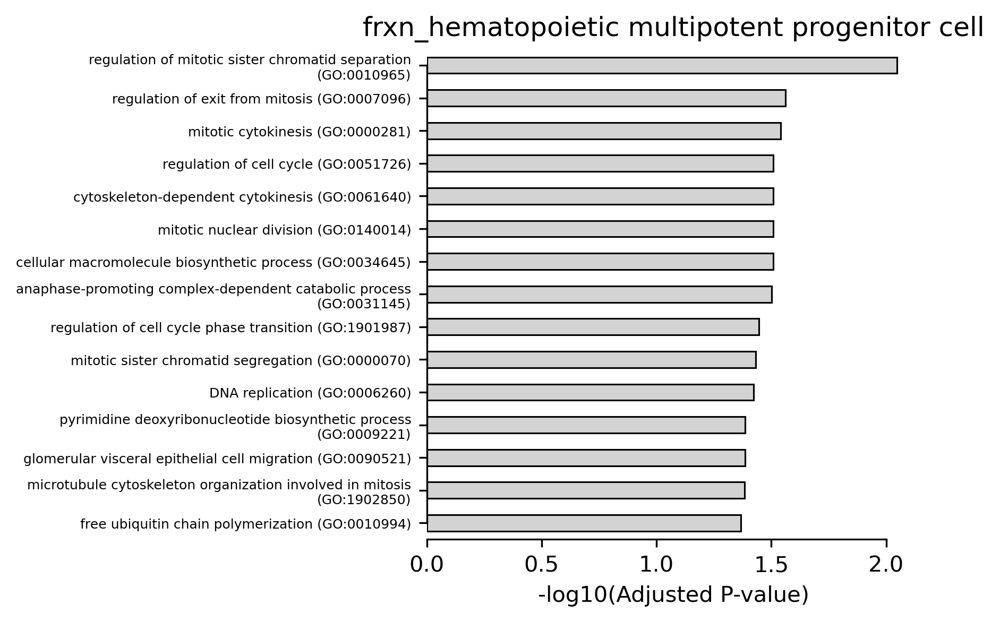

12:05:48 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_hematopoietic precursor cell ====================
                                                                    path_name  adj_p_val        genes
    positive regulation of proteasomal protein catabolic process (GO:1901800)   0.055721   ELOB,NUPR1
                    regulation of interleukin-1 alpha production (GO:0032650)   0.055721      S100A13
                          intracellular sequestering of iron ion (GO:0006880)   0.055721          FTL
    negative regulation of cardiac muscle cell apoptotic process (GO:0010667)   0.055721        NUPR1
              regulation of type B pancreatic cell proliferation (GO:0061469)   0.055721        NUPR1
negative regulation of DNA-binding transcription factor activity (GO:0043433)   0.055721 NUPR1,COMMD6
   negative regulation of striated muscle cell apoptotic process (GO:0010664)   0.055721        NUPR1
                mast cell activation involved in immune response (GO:0002279)   0.055721      S100A13
      

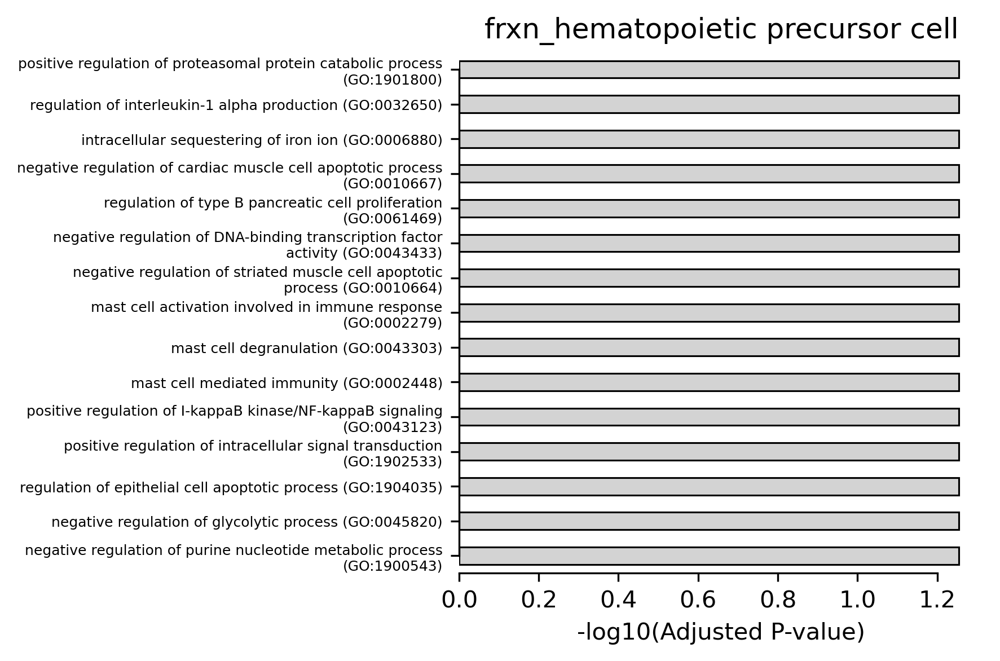

12:05:49 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_hematopoietic stem cell ====================
                                                                   path_name  adj_p_val              genes
  positive regulation of protein localization to cell periphery (GO:1904377)   0.000878 LGALS3,LRP1,SQSTM1
 positive regulation of protein localization to plasma membrane (GO:1903078)   0.000878 LGALS3,LRP1,SQSTM1
          regulation of protein localization to plasma membrane (GO:1903076)   0.002149 LGALS3,LRP1,SQSTM1
        positive regulation of protein localization to membrane (GO:1905477)   0.003238 LGALS3,LRP1,SQSTM1
                                      regulation of endocytosis (GO:0030100)   0.044579        LGALS3,LRP1
         positive regulation of cellular component organization (GO:0051130)   0.049120        LGALS3,LRP1
                                 regulation of sterol transport (GO:0032371)   0.049120               LRP1
positive regulation of protein catabolic process in the vacuole (GO:19043

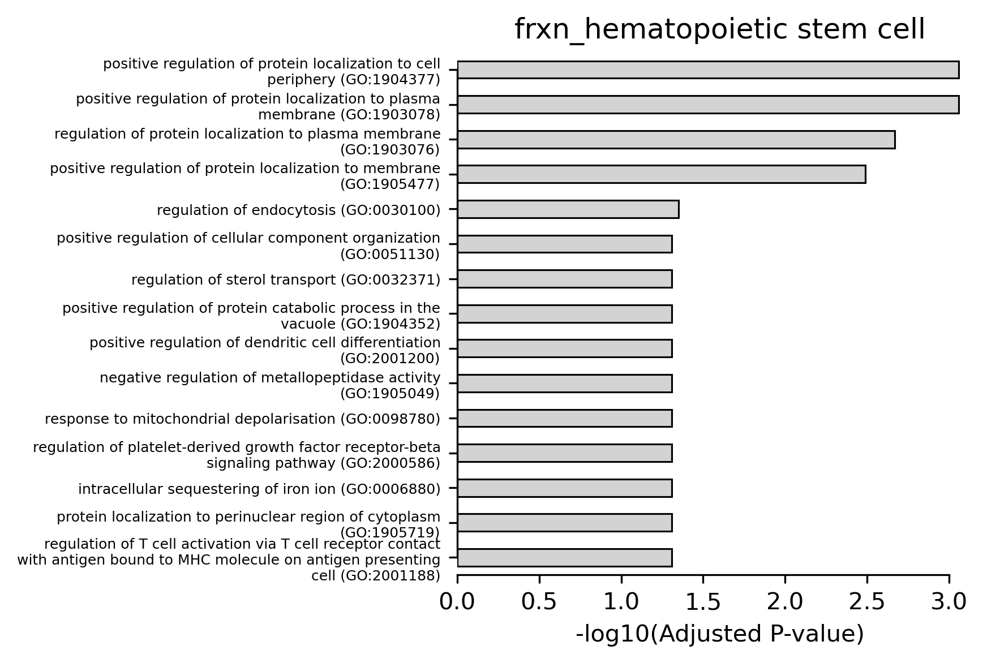

12:05:50 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_megakaryocyte progenitor cell ====================
                                                                  path_name  adj_p_val      genes
                                  collagen fibril organization (GO:0030199)   0.042177 DST,COL6A3
              modulation by symbiont of host apoptotic process (GO:0052150)   0.042177     RNF213
     negative regulation by symbiont of host apoptotic process (GO:0033668)   0.042177     RNF213
 negative regulation by symbiont of host programmed cell death (GO:0052041)   0.042177     RNF213
                   negative regulation of platelet aggregation (GO:0090331)   0.042177      PRKG1
           negative regulation of homotypic cell-cell adhesion (GO:0034111)   0.042177      PRKG1
                                        hemidesmosome assembly (GO:0031581)   0.042177        DST
regulation of vascular associated smooth muscle cell migration (GO:1904752)   0.042177      PRKG1
           negative regulation of smooth 

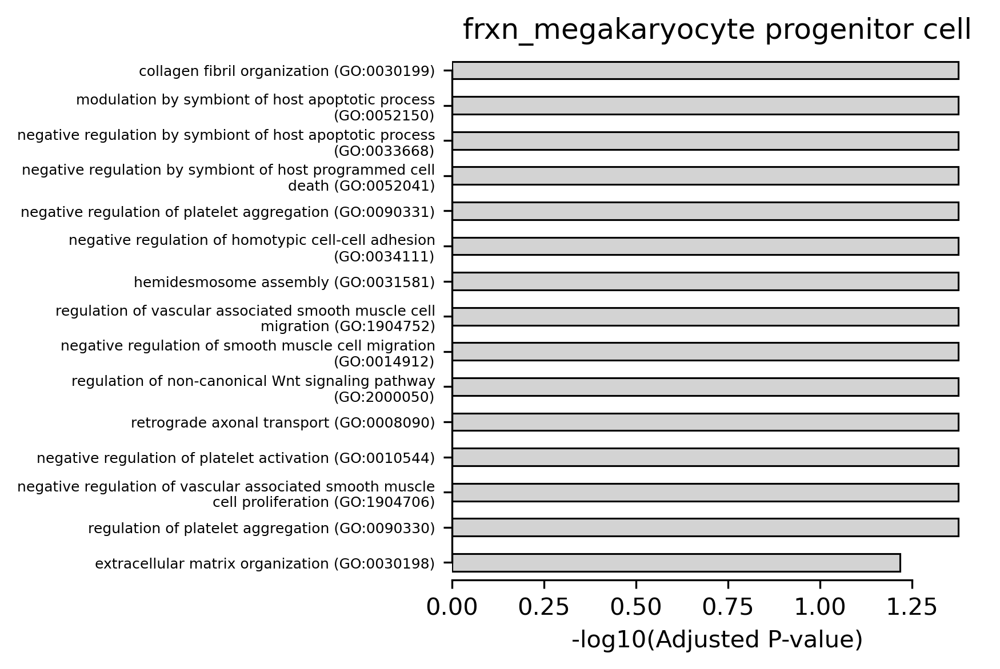

12:05:50 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_retinal blood vessel endothelial cell ====================
                                                                             path_name  adj_p_val genes
                                                     glycolipid transport (GO:0046836)   0.116794  PSAP
                                                       ceramide transport (GO:0035627)   0.123948  PSAP
                     regulation of voltage-gated calcium channel activity (GO:1901385)   0.123948 AHNAK
             regulation of calcium ion transmembrane transporter activity (GO:1901019)   0.123948 AHNAK
                                      glycosphingolipid metabolic process (GO:0006687)   0.123948  PSAP
                                             glycolipid metabolic process (GO:0006664)   0.123948  PSAP
                                                carboxylic acid transport (GO:0046942)   0.123948  PSAP
adenylate cyclase-inhibiting G protein-coupled receptor signaling pathway (GO:00071

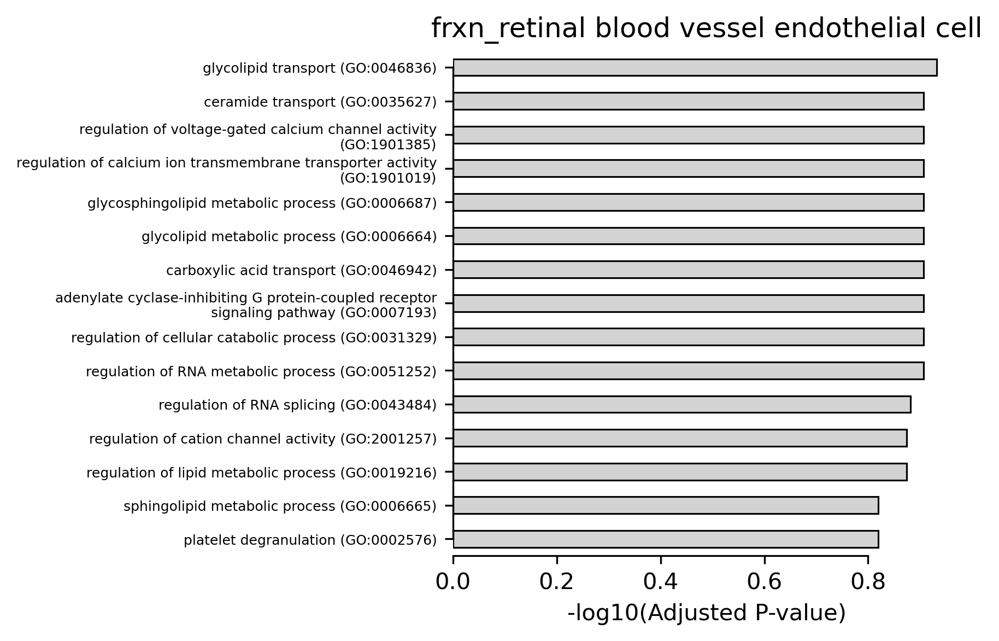

12:05:51 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_skeletal muscle fibroblast ====================
                                                                           path_name  adj_p_val       genes
                                   chemokine-mediated signaling pathway (GO:0070098)   0.028998 CXCL8,CXCL1
                                         cellular response to chemokine (GO:1990869)   0.028998 CXCL8,CXCL1
antimicrobial humoral immune response mediated by antimicrobial peptide (GO:0061844)   0.028998 CXCL8,CXCL1
                                                  neutrophil chemotaxis (GO:0030593)   0.028998 CXCL8,CXCL1
                                                 granulocyte chemotaxis (GO:0071621)   0.028998 CXCL8,CXCL1
                                                   neutrophil migration (GO:1990266)   0.028998 CXCL8,CXCL1
                      cellular response to molecule of bacterial origin (GO:0071219)   0.048681 CXCL8,CXCL1
                                cellular response to lipopolys

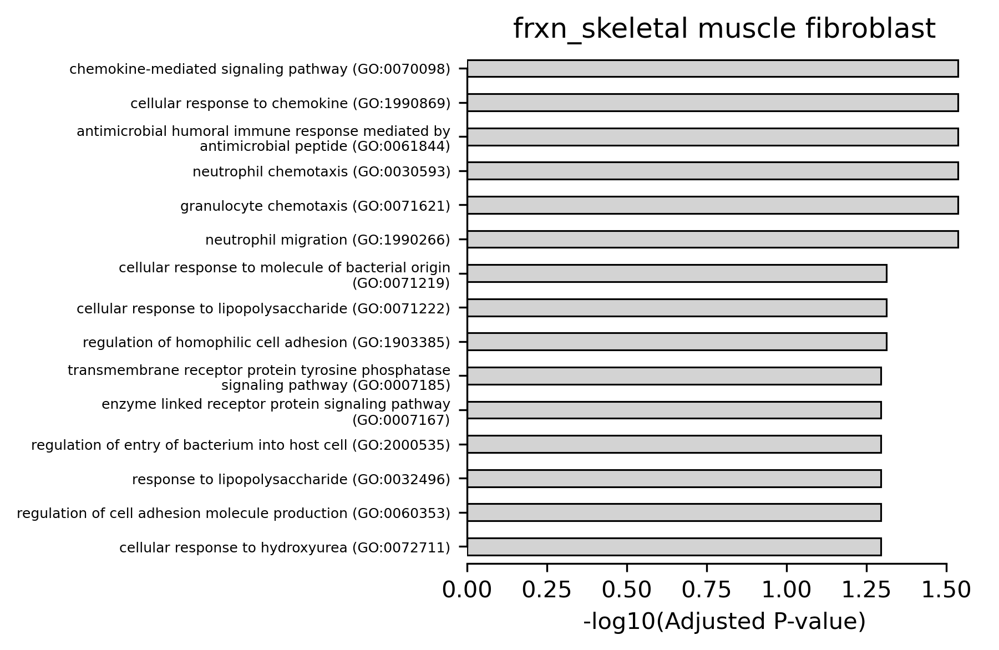

12:05:51 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_skin fibroblast ====================
                                                     path_name  adj_p_val                            genes
negative regulation of viral entry into host cell (GO:0046597)   0.000037               IFITM3,IFITM1,LY6E
          negative regulation of viral life cycle (GO:1903901)   0.000037               IFITM3,IFITM1,LY6E
         regulation of viral entry into host cell (GO:0046596)   0.000194               IFITM3,IFITM1,LY6E
              type I interferon signaling pathway (GO:0060337)   0.000551               IFITM3,IFITM1,IFI6
           cellular response to type I interferon (GO:0071357)   0.000551               IFITM3,IFITM1,IFI6
       regulation of mitochondrial depolarization (GO:0051900)   0.000911                         IFI6,DCN
                           innate immune response (GO:0045087)   0.001564           IFITM3,IFITM1,IFI6,B2M
              cytokine-mediated signaling pathway (GO:0019221)   0.001564 IFITM3,

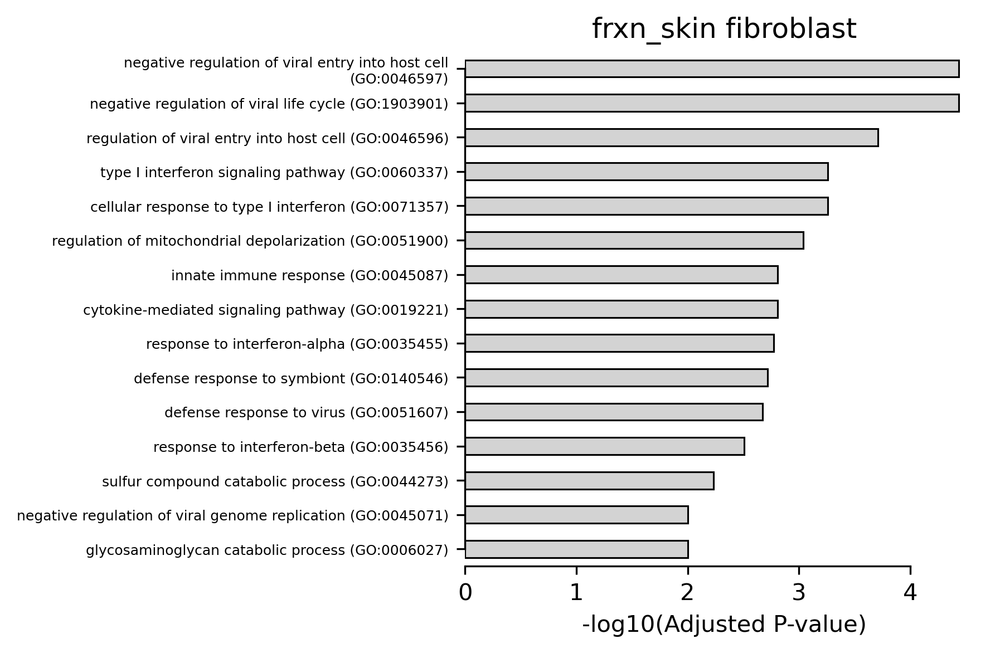

12:05:52 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


==================== frxn_vein endothelial cell ====================
                                                                                  path_name  adj_p_val         genes
                regulation of vascular associated smooth muscle cell migration (GO:1904752)   0.005589 ADAMTS1,PRKG1
            regulation of vascular associated smooth muscle cell proliferation (GO:1904705)   0.027896 ADAMTS1,PRKG1
               positive regulation of axon extension involved in axon guidance (GO:0048842)   0.064280        SEMA5A
                              positive regulation of protein kinase C activity (GO:1900020)   0.064280         CEMIP
                                       regulation of protein kinase C activity (GO:1900019)   0.064280         CEMIP
                                        intracellular sequestering of iron ion (GO:0006880)   0.064280           FTL
blood vessel endothelial cell proliferation involved in sprouting angiogenesis (GO:0002043)   0.064280        SE

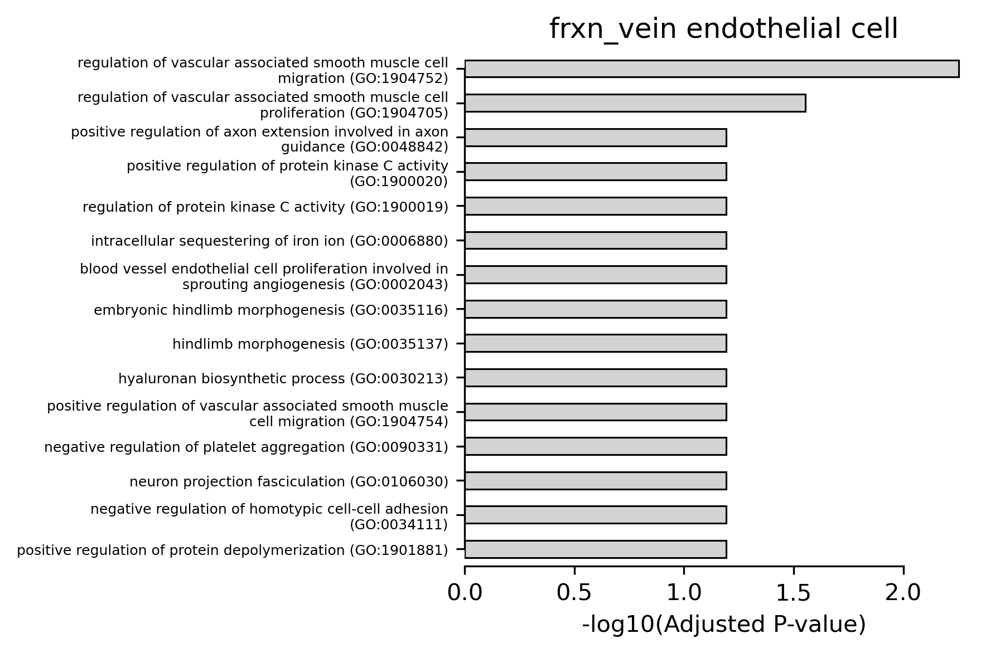

In [13]:
# Filter significant correlations
alpha = 0.05
pdf = cor_df[cor_df['P-value'] < alpha].copy()
pdf = pdf.sort_values(['Fraction Type', 'SpearmanR'], ascending=[True, False])
pdf = pdf[~pdf['Gene'].str.startswith('RP')]

# Get top 15 genes by Fraction Type
top_cor_df = pdf.groupby('Fraction Type', group_keys=False).head(15)

for frac_type, group in top_cor_df.groupby('Fraction Type'):
    genes = group['Gene'].head(100).tolist()
    edf = gget.enrichr(genes, database="ontology")
    edf['genes'] = edf['overlapping_genes'].apply(lambda x: ",".join(x))
    edf = edf[['path_name', 'adj_p_val', 'genes']]
    print("=" * 20, f"{frac_type}", "=" * 20)
    print(edf.head(10).to_string(index=False))

    edf['log_adj_p'] = -np.log10(edf['adj_p_val'].clip(lower=1e-300))
    edf['path_name_wrapped'] = edf['path_name'].apply(lambda x: '\n'.join(textwrap.wrap(x, width=60)))

    # Barplot
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 4, 4
    sns.barplot(
        data=edf.head(15),
        y='path_name_wrapped',
        x='log_adj_p',
        ec='k',
        color='lightgrey',
        linewidth=0.75,
        width=0.5,
    )
    plt.xlabel('-log10(Adjusted P-value)')
    plt.ylabel('')
    plt.yticks(fontsize=6)
    plt.title(frac_type)
    sns.despine(trim=True)
    plt.show()

# Plotting

In [14]:
pdf = cor_df[cor_df['P-value'] < alpha].copy()
pdf[pdf['Fraction Type'] == 'frxn_endothelial_cells'].sort_values('SpearmanR', ascending=False).head(25)

,Fraction Type,Gene,SpearmanR,P-value


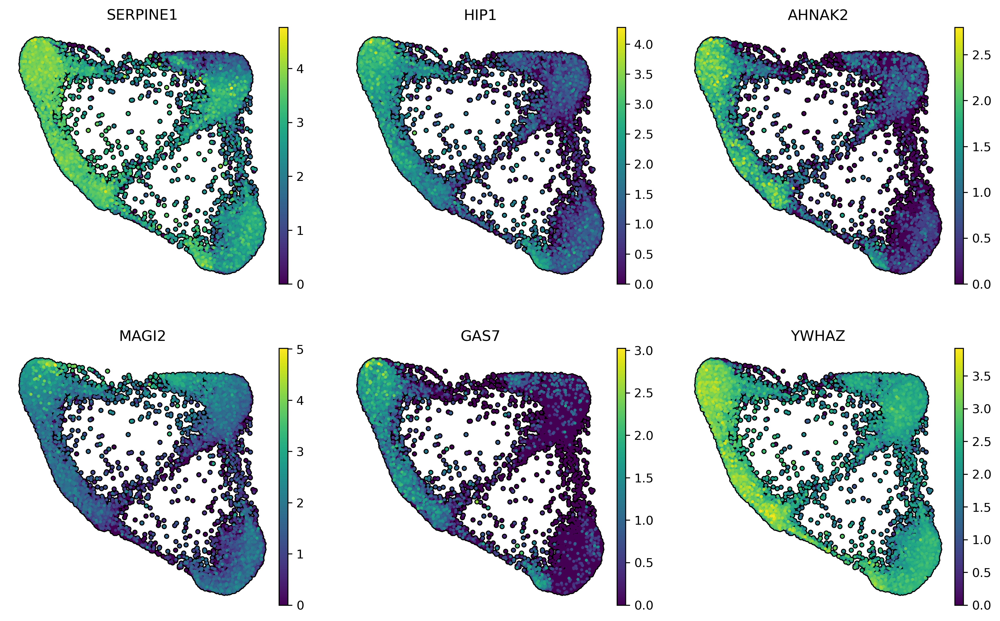

In [15]:

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

color = [
    'SERPINE1', 'HIP1', 'AHNAK2',
    'MAGI2', 'GAS7', 'YWHAZ',
]

sc.pl.draw_graph(
    adata, 
    color=color,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.15,
)


In [16]:
# For each fraction type, get top genes by absolute Spearman R
alpha = 0.05
pdf = cor_df[cor_df['P-value'] < alpha].copy()
pdf = pdf.sort_values(['Fraction Type', 'SpearmanR'], ascending=[True, False])
pdf = pdf[~pdf['Gene'].str.startswith('RP')]


labels = {
    'frxn_endothelial_cells': 'Endothelial Cells',
    'frxn_fibroblasts': 'Fibroblasts',
    'frxn_hematopoietic_progenitors': 'Progenitors',
    'frxn_hsc': 'HSCs'
}


# For each fraction type, get top genes by absolute Spearman R
top_cor_df = pdf.groupby('Fraction Type', group_keys=False).head(15)
top_cor_df['label'] = top_cor_df['Fraction Type'].map(labels)

for group, group_df in top_cor_df.groupby(['label']):

    frxn_type = group_df['Fraction Type'].unique()[0]
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 4, 4

    sc.pl.draw_graph(
        adata, 
        color=[frxn_type] + group_df['Gene'].head(8).to_list(),
        size=25,
        ncols=3,
        alpha=1,
        use_raw=False,
        add_outline=True,
        outline_color=('k', 'k'),
        title=[group[0]] + group_df['Gene'].head(8).to_list(),
        frameon=False,
        wspace=0.15,
        show=False, 
    )

    plt.suptitle(f"{group[0]} correlates", fontsize=14)
    plt.show()    

/tmp/ipykernel_2491922/1925226384.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_cor_df['label'] = top_cor_df['Fraction Type'].map(labels)
